In [1]:
import sys
sys.path.insert(0, "..")

import random
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import torch
import pyro
import foraging_toolkit as ft
import torch.nn.functional as F
import pyro.distributions as dist
import pyro.optim as optim
from pyro.nn import PyroModule
from pyro.infer.autoguide import AutoNormal, AutoDiagonalNormal, AutoMultivariateNormal, init_to_mean, init_to_value
from pyro.contrib.autoguide import AutoLaplaceApproximation
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import Adam
from pyro.infer import Predictive
from pyro.infer import MCMC, NUTS

import os
import logging
logging.basicConfig(format='%(message)s', level=logging.INFO)
smoke_test = ('CI' in os.environ)


#import foraging_toolkit as ft

In [2]:
with open('communicatorsDFs.pkl', 'rb') as f:
    communicatorsDFs = pickle.load(f)
birdsDF = communicatorsDFs[0]
rewardsDF = communicatorsDFs[1]

In [3]:
rewardsDF

,x,y,time
0,0,24,1
1,1,24,1
2,2,24,1
3,3,24,1
4,0,25,1
...,...,...,...
1,0,25,42
0,0,24,43
1,0,25,43
0,0,25,44


In [4]:
grid_max = max(max(birdsDF['x']), max(birdsDF['y']))
print(grid_max)

29.0


In [5]:
maxes = [max(birdsDF['time']), max(rewardsDF['time'])]
limit = min(maxes)
print(maxes)
birdsDF = birdsDF[birdsDF['time'] <= limit]
rewardsDF = rewardsDF[rewardsDF['time'] <= limit]

[140, 45]


In [6]:
birdsDF = birdsDF[birdsDF['bird']  >= 3]

In [7]:

class EmptyObject:
    pass

communicators = EmptyObject()

communicators.grid_size = int(grid_max)
communicators.num_frames = int(limit)
communicators.birdsDF = birdsDF
communicators.rewardsDF = rewardsDF
communicators.birds = [group for _, group in birdsDF.groupby('bird')]
communicators.rewards = [group for _, group in rewardsDF.groupby('time')]
communicators.num_birds = len(communicators.birds)


step_maxes = []
for b in range(len(communicators.birds)):
    step_maxes.append(max(
    max([abs(communicators.birds[b]['x'][t+1] - communicators.birds[b]['x'][t]) for t in range(communicators.num_frames-1)]),
    max([abs(communicators.birds[b]['y'][t+1] - communicators.birds[b]['y'][t]) for t in range(communicators.num_frames-1)])
    )
    )

communicators.step_size_max = max(step_maxes)

In [8]:
ft.animate_birds(communicators, plot_rewards=True,
                  width = 600, height = 600, point_size = 10)

In [9]:
communicators_derived = ft.derive_predictors(communicators, visibility_range=5)

In [10]:
ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10,plot_traces=True, trace_multiplier=1.5)

In [11]:
ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10, 
                  plot_visibility=2, plot_traces=True, trace_multiplier= 1)

In [12]:
ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10, plot_proximity=2)

In [13]:
sim = communicators

b = 4

other_birdsDF = sim.birdsDF[sim.birdsDF["bird"] != b]

myself = sim.birdsDF[sim.birdsDF["bird"] == b]

out_of_range_birds = []
for t in range(1, len(sim.birds[0])):
    myself_x = myself["x"][myself['time'] == t]
    myself_y = myself["y"][myself['time'] == t]

    others_now = other_birdsDF[other_birdsDF["time"] == t].copy()

    others_now['distance'] = np.sqrt((others_now['x'] - myself_x)**2 
                                     + (others_now['y'] - myself_y)**2)

    others_now['out_of_range'] = others_now['distance'] > sim.visibility_range

    others_now = others_now[others_now['out_of_range']]

    
    on_reward = []
    for index, row in others_now.iterrows():
        
        others_x = row['x']
        others_y = row['y']

        on_reward.append(any(
            (others_x - sim.rewards[t-1]['x'] == 0) & 
            (others_y - sim.rewards[t-1]['y'] == 0)
        ))

    others_now['on_reward'] = on_reward

    out_of_range_birds.append(others_now)


out_of_range_birdsDF = pd.concat(out_of_range_birds)
out_of_range_birdsDF = out_of_range_birdsDF[out_of_range_birdsDF['on_reward'] == True]
   
print(out_of_range_birdsDF)


      x     y  time  bird    type   distance  out_of_range on_reward
6   3.0  24.0     7     3  random  14.560220          True       1.0
7   2.0  26.0     8     3  random  15.264338          True       1.0
8   2.0  26.0     9     3  random  13.416408          True       1.0
9   2.0  26.0    10     3  random  12.806248          True       1.0
11  2.0  25.0    12     3  random  13.038405          True       1.0
12  2.0  25.0    13     3  random  13.928388          True       1.0
13  2.0  25.0    14     3  random  14.317821          True       1.0
15  2.0  27.0    16     3  random  11.704700          True       1.0
16  2.0  27.0    17     3  random   9.486833          True       1.0
17  2.0  27.0    18     3  random   6.708204          True       1.0


In [14]:
info_time_decay = 3
info_spatial_decay = 0.15

out_of_range_birdsDF['delay'] = 1

expansion = [out_of_range_birdsDF.assign(
    time=out_of_range_birdsDF['time'] + i) for i in range(1, 
                                        info_time_decay+1)]

expansion_df = pd.concat(expansion, ignore_index=True)

callingDF = pd.concat([out_of_range_birdsDF,expansion_df])

callingDF.head(n=15)


,x,y,time,bird,type,distance,out_of_range,on_reward,delay
6,3.0,24.0,7,3,random,14.560220,True,1.0,1
7,2.0,26.0,8,3,random,15.264338,True,1.0,1
8,2.0,26.0,9,3,random,13.416408,True,1.0,1
9,2.0,26.0,10,3,random,12.806248,True,1.0,1
11,2.0,25.0,12,3,random,13.038405,True,1.0,1
12,2.0,25.0,13,3,random,13.928388,True,1.0,1
13,2.0,25.0,14,3,random,14.317821,True,1.0,1
15,2.0,27.0,16,3,random,11.704700,True,1.0,1
16,2.0,27.0,17,3,random,9.486833,True,1.0,1
17,2.0,27.0,18,3,random,6.708204,True,1.0,1


In [15]:

grid = ft.generate_grid(sim.grid_size)

communicates = []

for t in range(1,sim.num_frames+1):
    slice = callingDF[callingDF['time'] == t]
    communicate = grid.copy()
    communicate['bird'] = b
    communicate['time'] = t#slice['time'].iloc[0]
    communicate['communicate'] = 0
    communicate['communicate_standardized'] = 0

    if slice.shape[0] > 0:

        for _step in range(slice.shape[0]):
                communicate["communicate"] += ft.rewards_trace(
                    np.sqrt(
                        (slice["x"].iloc[_step] - communicate["x"]) ** 2
                        + (slice["y"].iloc[_step] - communicate["y"]) ** 2
                    ),
                    info_spatial_decay,
                )

        communicate['communicate_standardized'] = (
            communicate['communicate'] - communicate['communicate'].mean()
        ) / communicate['communicate'].std()

    
    communicates.append(communicate)

    communicatesDF = pd.concat(communicates)

sim.communicates = communicates
sim.communicatesDF = communicatesDF


print(communicatesDF.head(n=2))


   x  y  bird  time  communicate  communicate_standardized
0  1  1     4     1          0.0                       0.0
1  1  2     4     1          0.0                       0.0


In [16]:
communicators_derived = sim 


In [17]:
t = 7

com = sim.communicatesDF.copy()
rew = sim.rewardsDF.copy()
rew["bird"] = "reward"
df = pd.concat([sim.birdsDF, rew])
com = sim.communicatesDF.copy()
com = com[com["bird"] == 4]
com["who"] = com["bird"]
com["bird"] = "communicate"
df = pd.concat([df, com])
sub = df[(df["bird"] == "communicate")]
sub = sub[sub["time"] == t]
sub.head()


,x,y,time,bird,type,communicate,communicate_standardized,who
0,1.0,1.0,7,communicate,NaN,0.009879,-0.543401,4.0
1,1.0,2.0,7,communicate,NaN,0.012057,-0.529362,4.0
2,1.0,3.0,7,communicate,NaN,0.014713,-0.512236,4.0
3,1.0,4.0,7,communicate,NaN,0.017954,-0.491346,4.0
4,1.0,5.0,7,communicate,NaN,0.021906,-0.465870,4.0


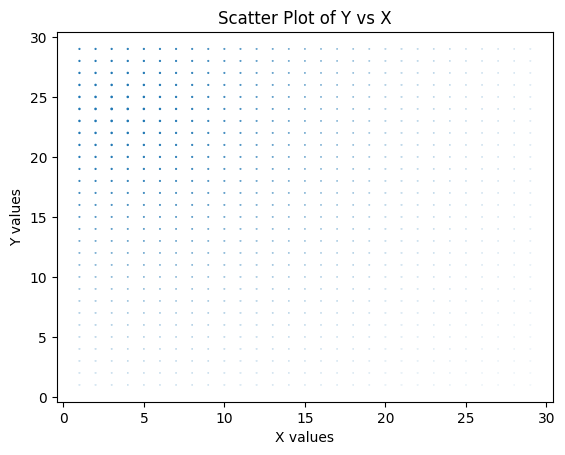

In [18]:
x = sub['x']
y = sub['y']
communicate = sub['communicate']

plt.scatter(x, y, s = communicate)
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Scatter Plot of Y vs X')
plt.show()

In [19]:
rew = sim.rewardsDF.copy()
rew["bird"] = "reward"
df = pd.concat([sim.birdsDF, rew])
com = sim.communicatesDF.copy()
com = com[com["bird"] == 4]
com["who"] = com["bird"]
com["bird"] = "communicate"
com["type"] = "communicator"
print(com.columns)
print(df.columns)
max_index_df = df.index.max()
df = df.reset_index(drop=True)
com = com.reset_index(drop=True)
com.index += max_index_df + 1
df = pd.concat([df,com], axis=0, verify_integrity=True, ignore_index=True)

print(df.shape)
print(df.index)
print(len(df.index.unique()))
print(df.head(n=1))

my_x = df['x']
my_y = df['y']
my_time = df['time']
my_bird = df['bird']
subdf = pd.DataFrame({'x': my_x, "y": my_y, "time": my_time, "bird": my_bird})

fig = px.scatter(subdf, x="x", y="y", 
                 animation_frame="time", color="bird")

print(
df['bird'].unique()
)

fig.show()


Index(['x', 'y', 'bird', 'time', 'communicate', 'communicate_standardized',
       'who', 'type'],
      dtype='object')
Index(['x', 'y', 'time', 'bird', 'type'], dtype='object')
(38406, 8)
RangeIndex(start=0, stop=38406, step=1)
38406
      x     y  time bird    type  communicate  communicate_standardized  who
0  11.0  21.0     1    3  random          NaN                       NaN  NaN
[3 4 'reward' 'communicate']


In [22]:
ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10, 
                  plot_visibility=2,
                  plot_communicate = 4,
                  plot_traces=True, communicate_multiplier = 
                  13, trace_multiplier= 1)

In [ ]:


ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10, 
                  plot_visibility=2, plot_communicate= 4,
                    plot_traces=True, trace_multiplier= 1)

NameError: name 'communicators_derived' is not defined

In [ ]:

ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10, 
                  plot_communicate=0, plot_visibility= 4,  communicate_multiplier= 10)